#  **<span style='color:#c32148 '>Customer Segmentation</span>**

###   **<span style='color:#c32148 '>Importing the Libraries</span>**

In [1]:
import numpy as np
import pandas as pd
import datetime
import matplotlib
import matplotlib.pyplot as plt
from matplotlib import colors
import seaborn as sns
import plotly.express as px

from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from yellowbrick.cluster import KElbowVisualizer
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt, numpy as np
from mpl_toolkits.mplot3d import Axes3D
from sklearn.cluster import AgglomerativeClustering
from matplotlib.colors import ListedColormap
from sklearn import metrics

import warnings
import sys
if not sys.warnoptions:
    warnings.simplefilter("ignore")

## **<span style='color:#8b67b8'>Loading the Data</span>**

In [2]:
path=(r"C:\Users\ROHIT\Desktop\Internship Project\Untitled Folder\market_data.xlsx")
xl=pd.ExcelFile(path)
df=xl.parse("marketing_campaign")
print("Total number of Data points",len(df))
df.head()

Total number of Data points 2240


,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,...,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,2014-02-10,26,11,...,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,2014-01-19,94,173,...,5,0,0,0,0,0,0,3,11,0


In [3]:
duplicate = df[df.duplicated()]
duplicate

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response


In [4]:
df.shape

(2240, 29)

In [5]:
print("There are Total of ",len(df.columns))
df.columns

There are Total of  29


Index(['ID', 'Year_Birth', 'Education', 'Marital_Status', 'Income', 'Kidhome',
       'Teenhome', 'Dt_Customer', 'Recency', 'MntWines', 'MntFruits',
       'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Complain', 'Z_CostContact', 'Z_Revenue', 'Response'],
      dtype='object')

## **<span style='color:#8b67b8'>Data cleaning </span>**

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   ID                   2240 non-null   int64         
 1   Year_Birth           2240 non-null   int64         
 2   Education            2240 non-null   object        
 3   Marital_Status       2240 non-null   object        
 4   Income               2216 non-null   float64       
 5   Kidhome              2240 non-null   int64         
 6   Teenhome             2240 non-null   int64         
 7   Dt_Customer          2240 non-null   datetime64[ns]
 8   Recency              2240 non-null   int64         
 9   MntWines             2240 non-null   int64         
 10  MntFruits            2240 non-null   int64         
 11  MntMeatProducts      2240 non-null   int64         
 12  MntFishProducts      2240 non-null   int64         
 13  MntSweetProducts     2240 non-nul

In [7]:
df.isnull().sum()

ID                      0
Year_Birth              0
Education               0
Marital_Status          0
Income                 24
Kidhome                 0
Teenhome                0
Dt_Customer             0
Recency                 0
MntWines                0
MntFruits               0
MntMeatProducts         0
MntFishProducts         0
MntSweetProducts        0
MntGoldProds            0
NumDealsPurchases       0
NumWebPurchases         0
NumCatalogPurchases     0
NumStorePurchases       0
NumWebVisitsMonth       0
AcceptedCmp3            0
AcceptedCmp4            0
AcceptedCmp5            0
AcceptedCmp1            0
AcceptedCmp2            0
Complain                0
Z_CostContact           0
Z_Revenue               0
Response                0
dtype: int64

#### **From the above output, we can conclude and note that:**

>There are missing values in income (24 values are missing).

>Dt_Customer that indicates the date a customer joined the database is not parsed as DateTime

>There are some categorical features in our data frame; as there are some features in dtype: object). So we will need to encode them into numeric forms later.

>First of all, for the missing values, I am simply going to drop the rows that have missing income values.

In [8]:
## Dropping NA Values

In [9]:
df=df.dropna()
print("Number of Data Points after Removing NA Values is", len(df))

Number of Data Points after Removing NA Values is 2216


**In the next step, I am going to create a feature out of "Dt_Customer" that indicates the number of days a customer is registered in the firm's database. However, in order to keep it simple, I am taking this value relative to the most recent customer in the record.**


In [10]:
df["Dt_Customer"] = pd.to_datetime(df["Dt_Customer"])
dates = []
for i in df["Dt_Customer"]:
    i = i.date()
    dates.append(i)  
#Dates of the newest and oldest recorded customer
print("The newest customer's enrolment date in therecords:",max(dates))
print("The oldest customer's enrolment date in the records:",min(dates))

The newest customer's enrolment date in therecords: 2014-06-29
The oldest customer's enrolment date in the records: 2012-07-30


**Creating a feature ("Customer_For") of the number of days the customers started to shop in the store relative to the last recorded date**

In [11]:
days = []
d1 = max(dates) #taking it to be the newest customer
for i in dates:
    delta = d1 - i
    days.append(delta)
df["Customer_For"] = days
df["Customer_For"] = pd.to_numeric(df["Customer_For"], errors="coerce")


**Now we will be exploring the unique values in the categorical features to get a clear idea of the data.**

In [12]:
print("Total categories in the feature Marital_Status:\n", df["Marital_Status"].value_counts(), "\n")
print("Total categories in the feature Education:\n", df["Education"].value_counts())

Total categories in the feature Marital_Status:
 Married     857
Together    573
Single      471
Divorced    232
Widow        76
Alone         3
Absurd        2
YOLO          2
Name: Marital_Status, dtype: int64 

Total categories in the feature Education:
 Graduation    1116
PhD            481
Master         365
2n Cycle       200
Basic           54
Name: Education, dtype: int64


## **<span style='color:#8b67b8'>Feature Engineering</span>**

Creating new features and exploring them 
>Extract the Age from the DOB ie("Year_Birth").

>Create another feature "Living_With" out of "Marital_Status" to extract the living situation of couples.

>Create a new feature spent that customer had spent in last 2 years.

>Create a feature "Children" to indicate total children in a household that is, kids and teenagers.

>To get further clarity of household, Creating feature indicating "Family_Size"

>Create a feature "Is_Parent" to indicate parenthood status

Lastly,create three categories in the "Education" by simplifying its value counts.

In [13]:
# Creating the customer Age by todays date
df['Age']=2023-df["Year_Birth"]

#Total Spendings
df["Spent"] = df["MntWines"]+ df["MntFruits"]+ df["MntMeatProducts"]+ df["MntFishProducts"]+ df["MntSweetProducts"]+ df["MntGoldProds"]

#Deriving living situation by marital status"Alone"
df["Living_With"]=df["Marital_Status"].replace({"Married":"Partner", "Together":"Partner", "Absurd":"Alone", "Widow":"Alone", "YOLO":"Alone", "Divorced":"Alone", "Single":"Alone",})

#Feature indicating total children living in the household
df["Children"]=df["Kidhome"]+df["Teenhome"]

#Feature for total members in the householde
df["Family_Size"] = df["Living_With"].replace({"Alone": 1, "Partner":2})+ df["Children"]

#Feature pertaining parenthood
df["Is_Parent"] = np.where(df.Children> 0, 1, 0)

#Segmenting education levels in three groups
df["Education"]=df["Education"].replace({"Basic":"Undergraduate","2n Cycle":"Undergraduate", "Graduation":"Graduate", "Master":"Postgraduate", "PhD":"Postgraduate"})

#For clarity
df=df.rename(columns={"MntWines": "Wines","MntFruits":"Fruits","MntMeatProducts":"Meat","MntFishProducts":"Fish","MntSweetProducts":"Sweets","MntGoldProds":"Gold"})

#Dropping some of the redundant features
to_drop = ["Marital_Status", "Dt_Customer", "Z_CostContact", "Z_Revenue", "Year_Birth", "ID"]
df= df.drop(to_drop, axis=1)

In [14]:
df.describe()

,Income,Kidhome,Teenhome,Recency,Wines,Fruits,Meat,Fish,Sweets,Gold,...,AcceptedCmp1,AcceptedCmp2,Complain,Response,Customer_For,Age,Spent,Children,Family_Size,Is_Parent
count,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,...,2216.000000,2216.000000,2216.000000,2216.000000,2.216000e+03,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000
mean,52247.251354,0.441787,0.505415,49.012635,305.091606,26.356047,166.995939,37.637635,27.028881,43.965253,...,0.064079,0.013538,0.009477,0.150271,3.054423e+16,54.179603,607.075361,0.947202,2.592509,0.714350
std,25173.076661,0.536896,0.544181,28.948352,337.327920,39.793917,224.283273,54.752082,41.072046,51.815414,...,0.244950,0.115588,0.096907,0.357417,1.749036e+16,11.985554,602.900476,0.749062,0.905722,0.451825
min,1730.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000e+00,27.000000,5.000000,0.000000,1.000000,0.000000
25%,35303.000000,0.000000,0.000000,24.000000,24.000000,2.000000,16.000000,3.000000,1.000000,9.000000,...,0.000000,0.000000,0.000000,0.000000,1.555200e+16,46.000000,69.000000,0.000000,2.000000,0.000000
50%,51381.500000,0.000000,0.000000,49.000000,174.500000,8.000000,68.000000,12.000000,8.000000,24.500000,...,0.000000,0.000000,0.000000,0.000000,3.071520e+16,53.000000,396.500000,1.000000,3.000000,1.000000
75%,68522.000000,1.000000,1.000000,74.000000,505.000000,33.000000,232.250000,50.000000,33.000000,56.000000,...,0.000000,0.000000,0.000000,0.000000,4.570560e+16,64.000000,1048.000000,1.000000,3.000000,1.000000
max,666666.000000,2.000000,2.000000,99.000000,1493.000000,199.000000,1725.000000,259.000000,262.000000,321.000000,...,1.000000,1.000000,1.000000,1.000000,6.039360e+16,130.000000,2525.000000,3.000000,5.000000,1.000000


The above stats show some discrepancies in mean Income and Age and max Income and age.

Do note that max-age is 130 years, As I calculated the age that would be today (i.e. 2023) and the data is old.

I must take a look at the broader view of the data. I will plot some of the selected features.

**Plotting some Defined/ Selected Features**

Relative Plot Of Some Selected Features: A Data Subset


<Figure size 800x550 with 0 Axes>

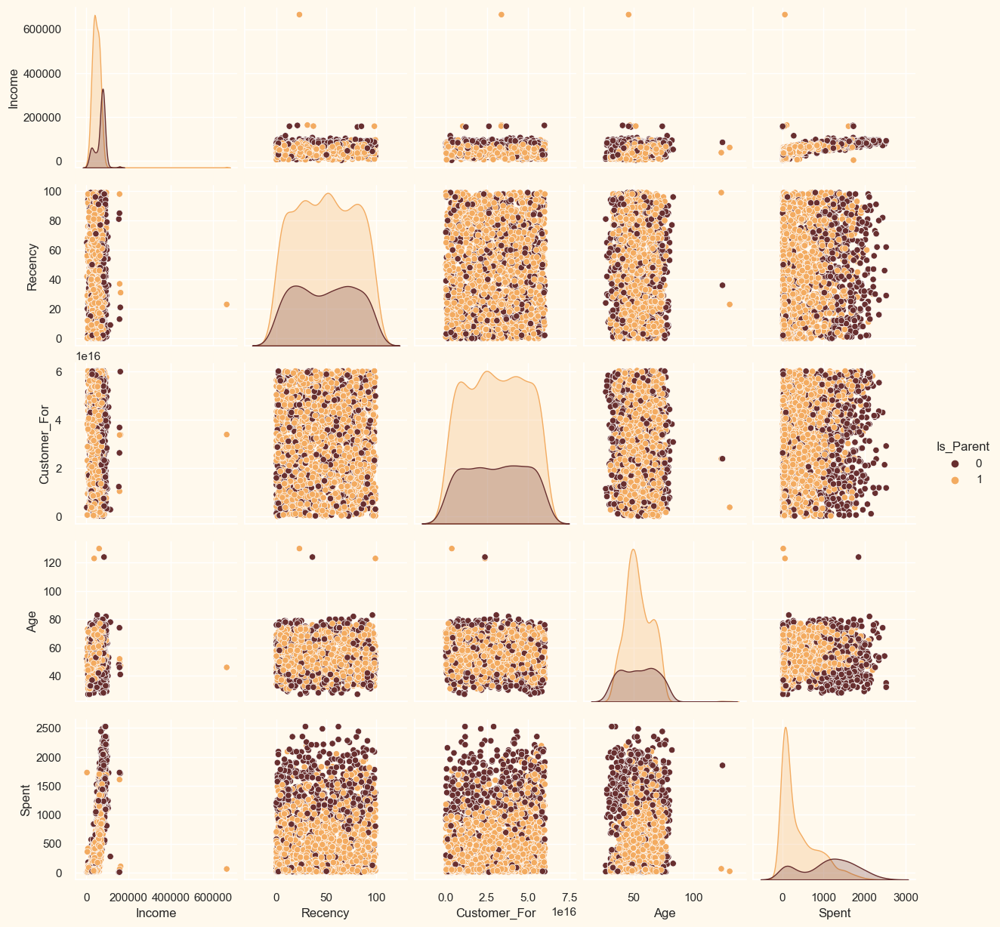

In [15]:
sns.set(rc={"axes.facecolor":"#FFF9ED","figure.facecolor":"#FFF9ED"})
pallet = ["#682F2F", "#9E726F", "#D6B2B1", "#B9C0C9", "#9F8A78", "#F3AB60"]
cmap = colors.ListedColormap(["#682F2F", "#9E726F", "#D6B2B1", "#B9C0C9", "#9F8A78", "#F3AB60"])

#Plotting following features
To_Plot = [ "Income", "Recency", "Customer_For", "Age", "Spent", "Is_Parent"]
print("Relative Plot Of Some Selected Features: A Data Subset")
plt.figure()
sns.pairplot(df[To_Plot], hue= "Is_Parent",palette= (["#682F2F","#F3AB60"]))

#Taking hue 
plt.show()

In [16]:
import plotly.express as px
fig = px.scatter_matrix(df,
    dimensions=["Income", "Recency", "Customer_For", "Age", "Spent", "Is_Parent"],
    color="Is_Parent",title="Plotting selected Data",template="plotly_dark")
fig.show()

**By just Observing the Data we can clearly observe that there are few Outliers sao we can drop them**

In [17]:
#Dropping the outliers by setting a cap on Age and income. 
df = df[(df["Age"]<90)]
df = df[(df["Income"]<600000)]
print("The total number of data-points after removing the outliers are:", len(df))

The total number of data-points after removing the outliers are: 2212


**Lets see the correlation betwen the values in data frame and excluding the categorical values**

In [18]:
z=df.corr()
fig = px.imshow(z,template="plotly_dark")
fig = px.imshow(z, text_auto=True,aspect="auto")
fig.show()

The Data is Quite clean as we can see by the above Heat Map

****


## **<span style='color:#8b67b8'> Visualization</span>**

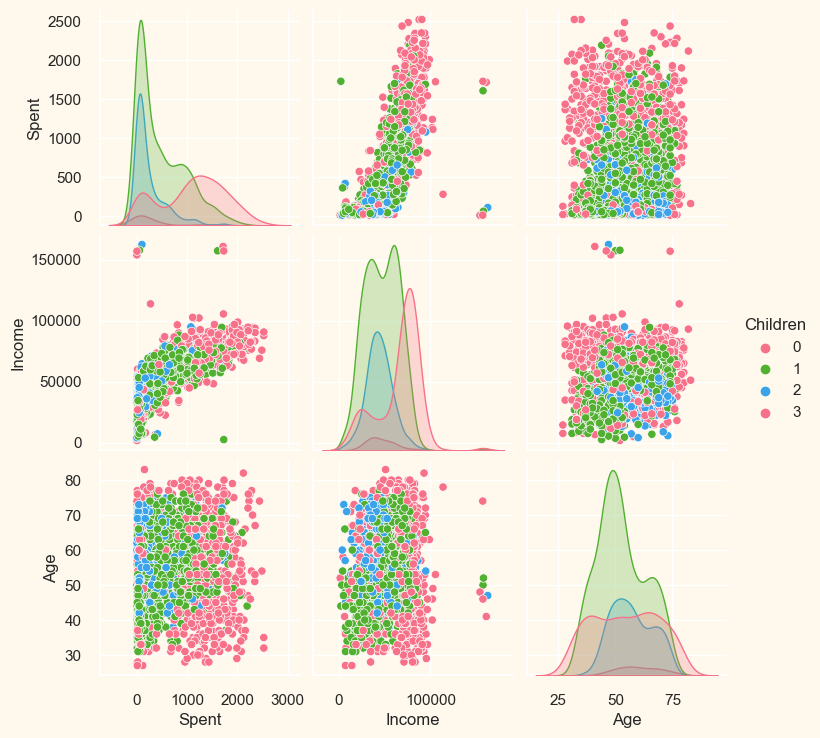

In [19]:
sns.pairplot(df,vars=['Spent','Income','Age'],hue='Children',palette='husl')

<Axes: xlabel='Spent', ylabel='Income'>

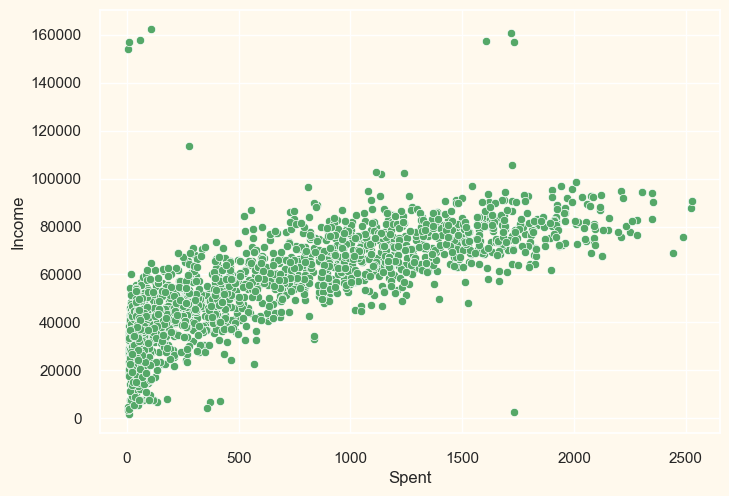

In [20]:
sns.scatterplot(x=df[df['Income']<600000]['Spent'],y=df[df['Income']<600000]['Income'],color = 'g')

<Axes: xlabel='Age', ylabel='Spent'>

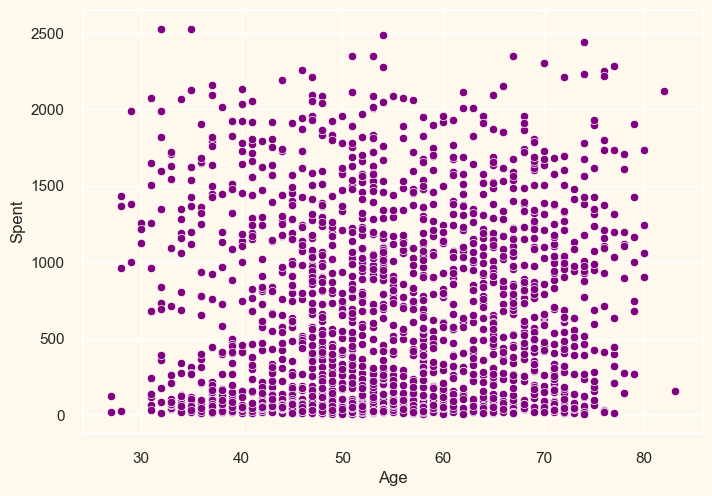

In [21]:
sns.scatterplot(x=df['Age'],y=df['Spent'],color = 'purple')

In [22]:
fig = px.histogram(df, x="Spent", y="Education", color="Education", marginal="rug",
                   hover_data=df.columns,template="plotly_dark")
fig.show()

Graduate         1115
Postgraduate      845
Undergraduate     252
Name: Education, dtype: int64

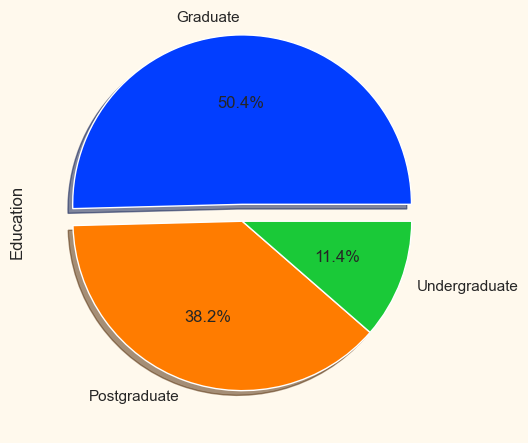

In [23]:
df['Education'].value_counts().plot.pie(explode=[0.1,0,0], autopct='%1.1f%%', shadow=True, colors=sns.color_palette('bright'));
df["Education"].value_counts()
#Graduate-0
#Postgraduate-1
#Undergraduate-2

## **<span style='color:#8b67b8'> Outlier Detection</span>**

<Axes: >

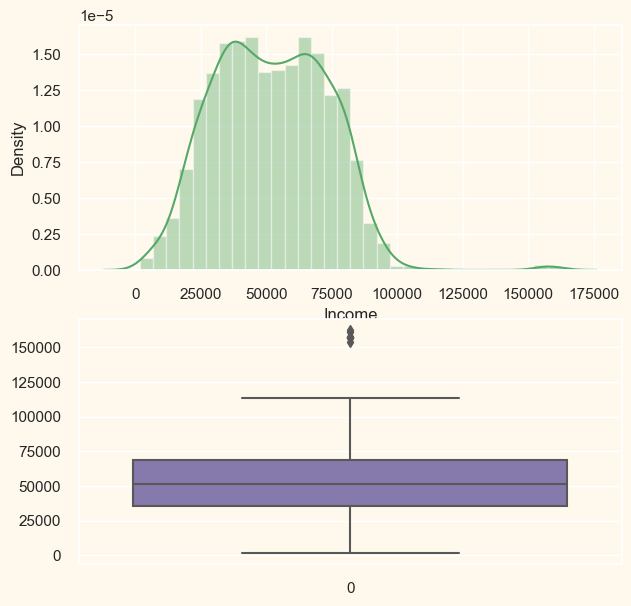

In [24]:
fig,(ax1,ax2) = plt.subplots(2,1,figsize = (7,7))
sns.distplot(df['Income'],ax=ax1,color='g')
sns.boxplot(df['Income'],ax=ax2,color='m')

<Axes: >

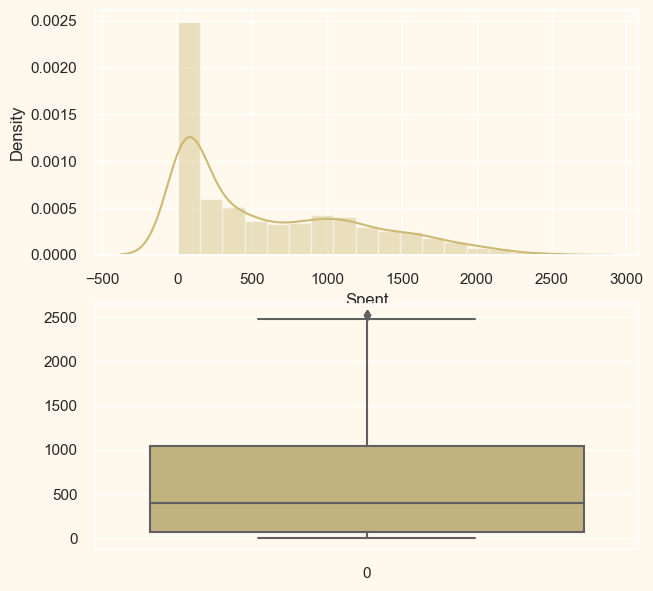

In [25]:
fig,(ax1,ax2) = plt.subplots(2,1,figsize = (7,7))
sns.distplot(df['Spent'],ax=ax1,color='y')
sns.boxplot(df['Spent'],ax=ax2,color='y')

***

## **<span style='color:#8b67b8'>Data Preprocessing</span>**

The following steps are applied to preprocess the data:

1.Label encoding the categorical features

2.Scaling the features using the standard scaler

3.Creating a subset dataframe for dimensionality reduction

In [26]:
se = (df.dtypes == 'object')
object_cols = list(se[se].index)

print("Categorical variables in the dataset:", object_cols)

Categorical variables in the dataset: ['Education', 'Living_With']


In [27]:
LE=LabelEncoder()
for i in object_cols:
    df[i]=df[[i]].apply(LE.fit_transform)
    
print("All features are now numerical")

All features are now numerical


1.Creating the copy of data

2.creating a subset of dataframe by dropping the features on deals accepted and promotions

3.Scaling the Data

In [28]:
#Creating a copy of data
ds = df.copy()
# creating a subset of dataframe by dropping the features on deals accepted and promotions
cols_del = ['AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1','AcceptedCmp2', 'Complain', 'Response']
ds = ds.drop(cols_del, axis=1)
#Scaling
scaler = StandardScaler()
scaler.fit(ds)
scaled_ds = pd.DataFrame(scaler.transform(ds),columns= ds.columns )
print("All features are now scaled")

All features are now scaled


In [29]:
scaled_ds.head()

,Education,Income,Kidhome,Teenhome,Recency,Wines,Fruits,Meat,Fish,Sweets,...,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Customer_For,Age,Spent,Living_With,Children,Family_Size,Is_Parent
0,-0.893586,0.287105,-0.822754,-0.929699,0.310353,0.977660,1.552041,1.690293,2.453472,1.483713,...,2.503607,-0.555814,0.692181,1.527721,1.018352,1.676245,-1.349603,-1.264598,-1.758359,-1.581139
1,-0.893586,-0.260882,1.040021,0.908097,-0.380813,-0.872618,-0.637461,-0.718230,-0.651004,-0.634019,...,-0.571340,-1.171160,-0.132545,-1.189011,1.274785,-0.963297,-1.349603,1.404572,0.449070,0.632456
2,-0.893586,0.913196,-0.822754,-0.929699,-0.795514,0.357935,0.570540,-0.178542,1.339513,-0.147184,...,-0.229679,1.290224,-0.544908,-0.206048,0.334530,0.280110,0.740959,-1.264598,-0.654644,-1.581139
3,-0.893586,-1.176114,1.040021,-0.929699,-0.795514,-0.872618,-0.561961,-0.655787,-0.504911,-0.585335,...,-0.913000,-0.555814,0.279818,-1.060584,-1.289547,-0.920135,0.740959,0.069987,0.449070,0.632456
4,0.571657,0.294307,1.040021,-0.929699,1.554453,-0.392257,0.419540,-0.218684,0.152508,-0.001133,...,0.111982,0.059532,-0.132545,-0.951915,-1.033114,-0.307562,0.740959,0.069987,0.449070,0.632456


***

## **<span style='color:#8b67b8'>Dimensionality Reduction</span>**

**There are many feature which are harder to work with and many of them  are highly co-related hence they are redundant so we have to perform the dimensionality reduction before perforing the Scaling** 

**For Dimensionality reduction we will perform the PCA (Principal Component Analysis)**

In [30]:
pca = PCA(n_components=3)
pca.fit(scaled_ds)
PCA_ds = pd.DataFrame(pca.transform(scaled_ds), columns=(["col1","col2", "col3"]))
PCA_ds.describe().T

,count,mean,std,min,25%,50%,75%,max
col1,2212.0,-1.027910e-16,2.878602,-5.978124,-2.539470,-0.781595,2.386380,7.452915
col2,2212.0,5.139550e-17,1.709469,-4.194801,-1.323986,-0.173744,1.234849,6.168192
col3,2212.0,3.934968e-17,1.231686,-3.624139,-0.853748,-0.051201,0.864623,6.746140


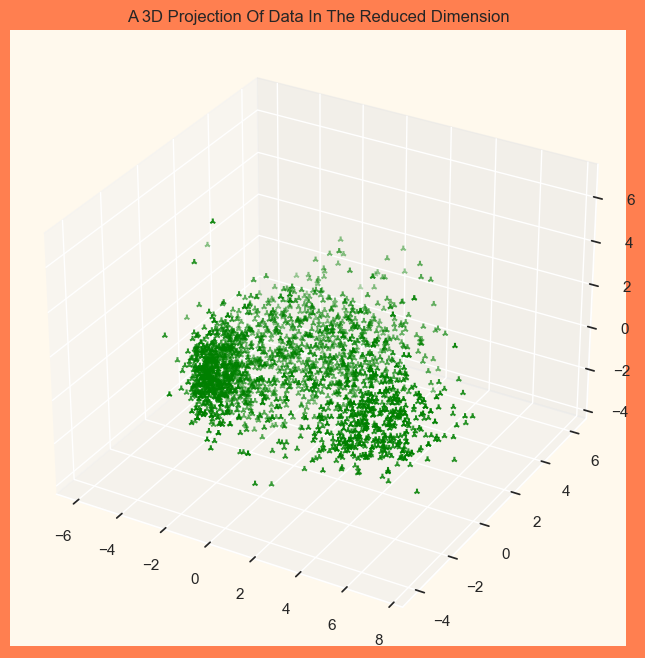

In [31]:
x =PCA_ds["col1"]
y =PCA_ds["col2"]
z =PCA_ds["col3"]
#To plot
fig = plt.figure(figsize=(10,8),facecolor= 'coral')
ax = fig.add_subplot(111, projection="3d")
ax.scatter(x,y,z, c="Green", marker="2" )
ax.set_title("A 3D Projection Of Data In The Reduced Dimension")
plt.show()


****

## **<span style='color:#8b67b8'>Clustering</span>**

**We will be performing clustering via Agglomerative clustering. Agglomerative clustering is a hierarchical clustering method. It involves merging examples until the desired number of clusters is achieved.**

**1.Elbow Method to determine the number of clusters to be formed**

**2.Clustering via Agglomerative Clustering**

**3.Examining the clusters formed via scatter plot**

**Agglomerative Clustering / Hierarchial Clustering**

Elbow Method to determine the number of clusters to be formed:


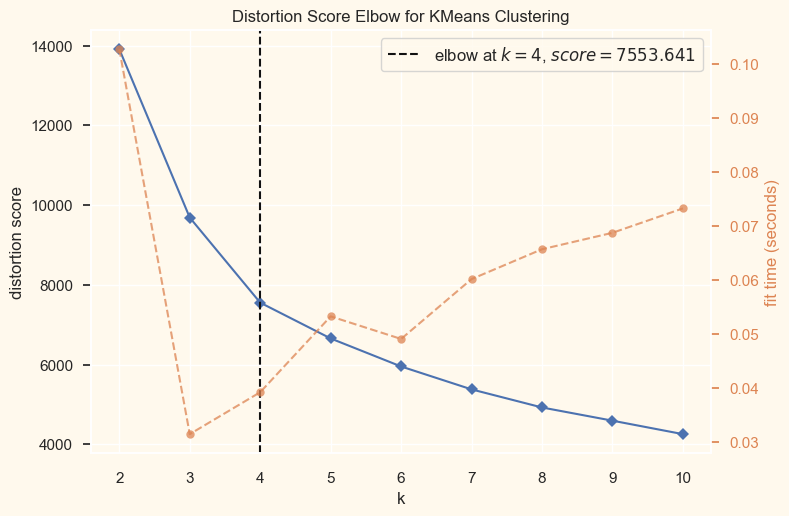

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [32]:
print('Elbow Method to determine the number of clusters to be formed:')
Elbow_M = KElbowVisualizer(KMeans(), k=10)
Elbow_M.fit(PCA_ds)
Elbow_M.show()

**4 will be the optimal Nummber of clusters**

In [33]:
#Initiating the Agglomerative Clustering model 
AC = AgglomerativeClustering(n_clusters=4)
# fit model and predict clusters
yhat_AC = AC.fit_predict(PCA_ds)
PCA_ds["Clusters"] = yhat_AC
#Adding the Clusters feature to the orignal dataframe.
df["Clusters"]= yhat_AC

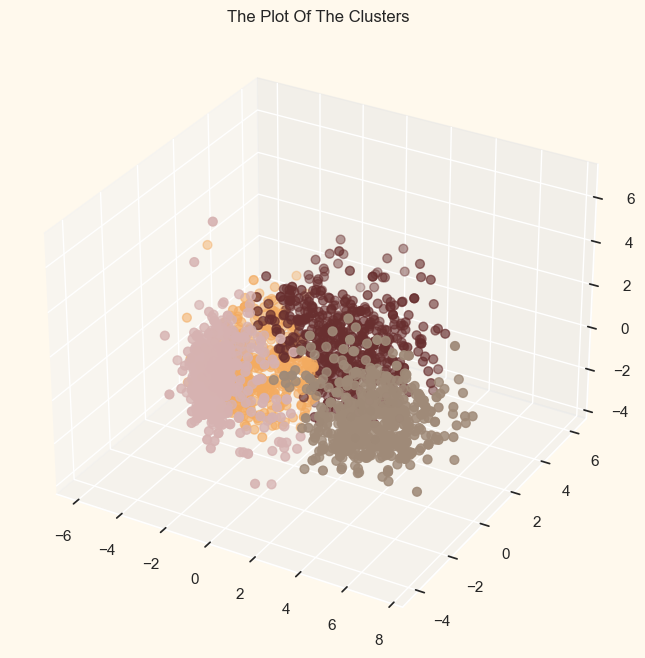

In [34]:
fig = plt.figure(figsize=(10,8))
ax = plt.subplot(111, projection='3d', label="bla")
ax.scatter(x, y, z, s=40, c=PCA_ds["Clusters"], marker='o', cmap = cmap )
ax.set_title("The Plot Of The Clusters")
plt.show()

**K-Means**

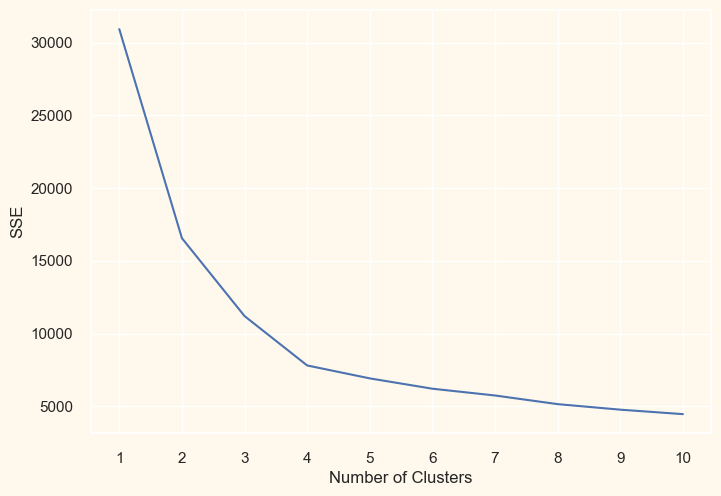

In [35]:
#initialize kmeans parameters
kmeans_kwargs = {
"init": "random",
"n_init": 10,
"random_state": 1,
}

#create list to hold SSE values for each k
sse = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
    kmeans.fit(PCA_ds)
    sse.append(kmeans.inertia_)

#visualize results
plt.plot(range(1, 11), sse)
plt.xticks(range(1, 11))
plt.xlabel("Number of Clusters")
plt.ylabel("SSE")
plt.show()

In [36]:
#instantiate the k-means class, using optimal number of clusters
kmeans = KMeans(init="random", n_clusters=3, n_init=10, random_state=1)

#fit k-means algorithm to data
kmeans.fit(PCA_ds)

#view cluster assignments for each observation
kmeans.labels_

array([1, 0, 1, ..., 1, 2, 0])

In [37]:
print(len(PCA_ds['Clusters']))

2212


In [38]:
import plotly.express as px
fig = px.scatter_matrix(df,
    dimensions=["Income", "Recency", "Customer_For", "Age", "Spent", "Is_Parent"],
    color="Is_Parent",title="Plotting selected Data",template="plotly_dark")
fig.show()

Same Almost 4 clusters

****

## **<span style='color:#8b67b8'> Evaluating the Models</span>**

**The purpose is to study the clusters which are formed and determine the nature of clusters pattern**

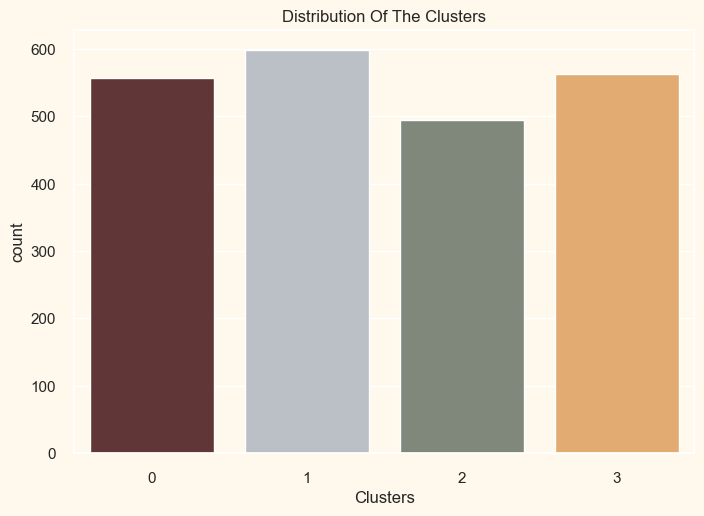

In [39]:
#Plotting countplot of clusters
pal = ["#682F2F","#B9C0C9", "#7F8A79","#F3AB60"]
pl = sns.countplot(x=df["Clusters"], palette= pal)
pl.set_title("Distribution Of The Clusters")
plt.show()

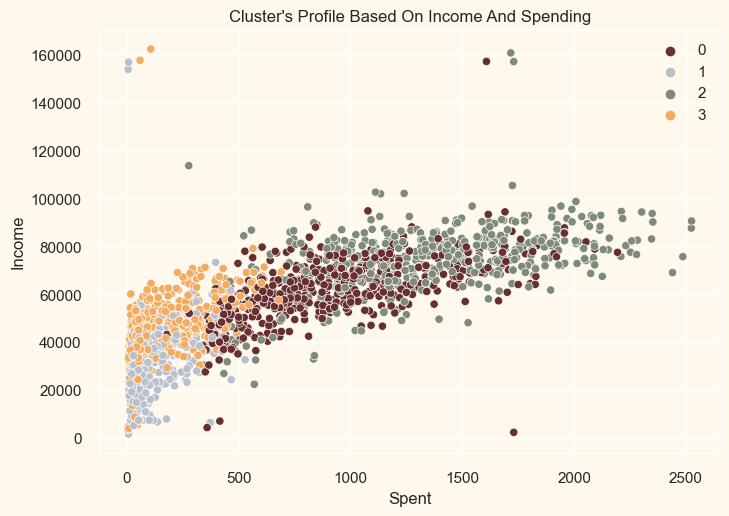

In [40]:
pl = sns.scatterplot(data = df,x=df["Spent"], y=df["Income"],hue=df["Clusters"], palette= pal)
pl.set_title("Cluster's Profile Based On Income And Spending")
plt.legend()

**Income vs spending plot shows the clusters pattern**

group 0: high spending & average income

group 1: high spending & low income

group 2: High spending & high income

group 3: low spending & low income


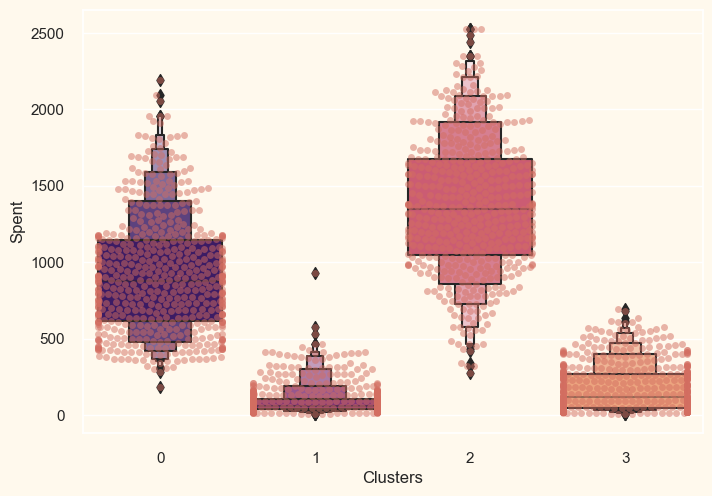

In [41]:
plt.figure()
pl=sns.swarmplot(x=df["Clusters"], y=df["Spent"], color= "#d36e61", alpha=0.5 )
pl=sns.boxenplot(x=df["Clusters"], y=df["Spent"], palette="magma")
plt.show()

From the above plot, it can be clearly seen that cluster 0 is our biggest set of customers closely followed by cluster 2. We can explore what each cluster is spending on for the targeted marketing strategies.

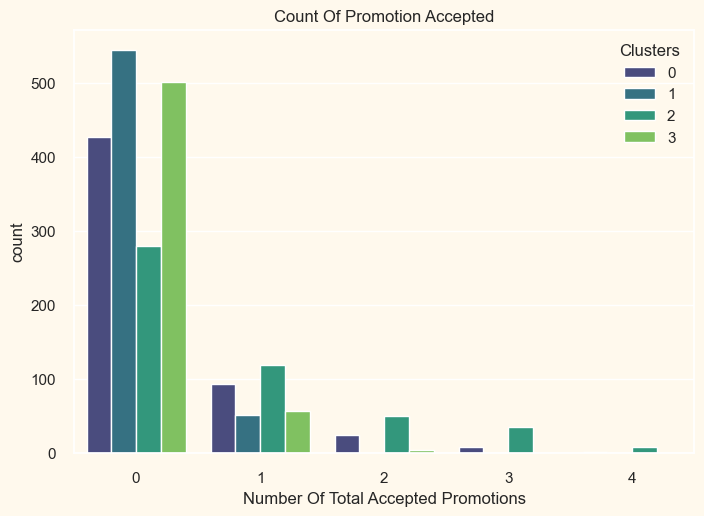

In [42]:
#Creating a feature to get a sum of accepted promotions 
df["Total_Promos"] = df["AcceptedCmp1"]+ df["AcceptedCmp2"]+ df["AcceptedCmp3"]+ df["AcceptedCmp4"]+ df["AcceptedCmp5"]
#Plotting count of total campaign accepted.
plt.figure()
pl = sns.countplot(x=df["Total_Promos"],hue=df["Clusters"], palette="viridis")
pl.set_title("Count Of Promotion Accepted")
pl.set_xlabel("Number Of Total Accepted Promotions")
plt.show()

There has not been an overwhelming response to the campaigns so far

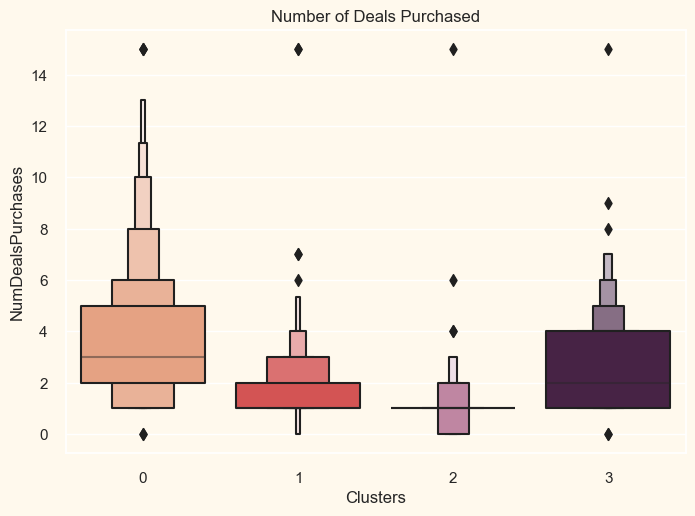

In [43]:
#Plotting the number of deals purchased
plt.figure()
pl=sns.boxenplot(y=df["NumDealsPurchases"],x=df["Clusters"], palette="rocket_r")
pl.set_title("Number of Deals Purchased")
plt.show()

Unlike campaigns, the deals offered did well. It has best outcome with cluster 0 and cluster 1

## Profiling

<Figure size 1000x800 with 0 Axes>

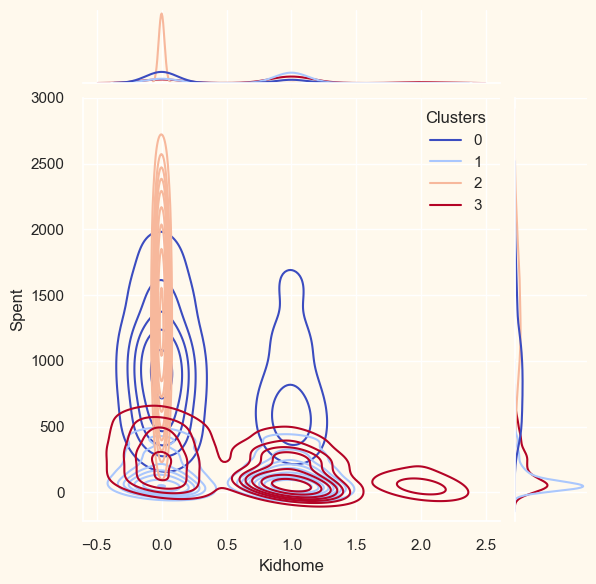

<Figure size 1000x800 with 0 Axes>

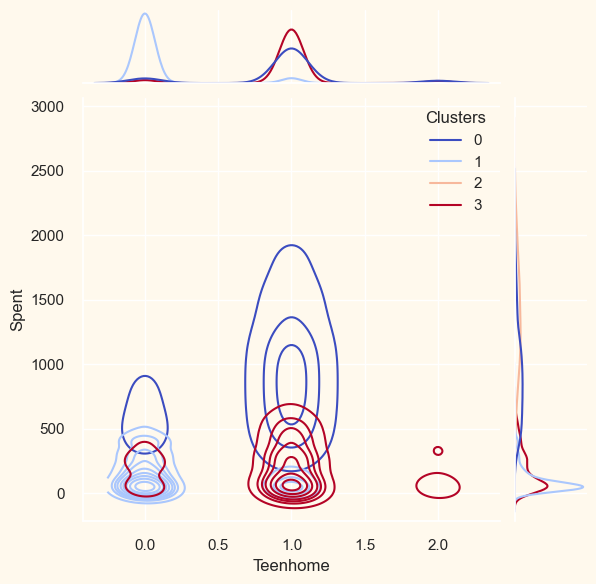

<Figure size 1000x800 with 0 Axes>

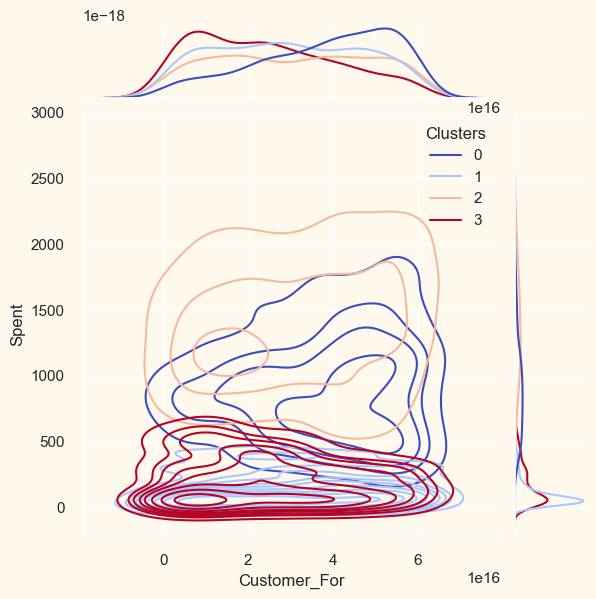

<Figure size 1000x800 with 0 Axes>

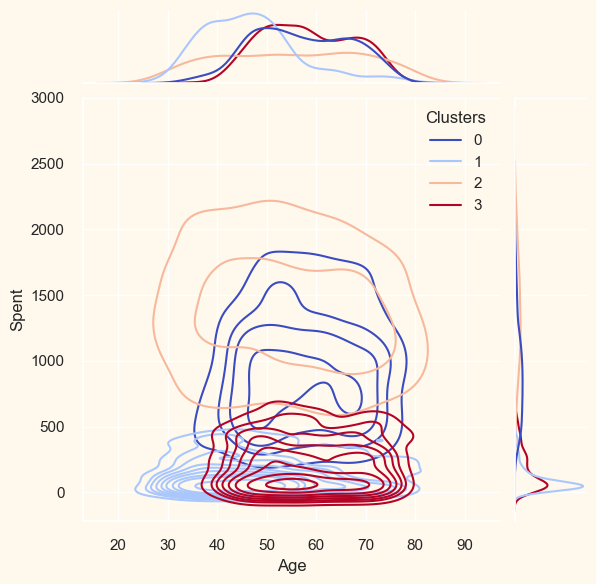

<Figure size 1000x800 with 0 Axes>

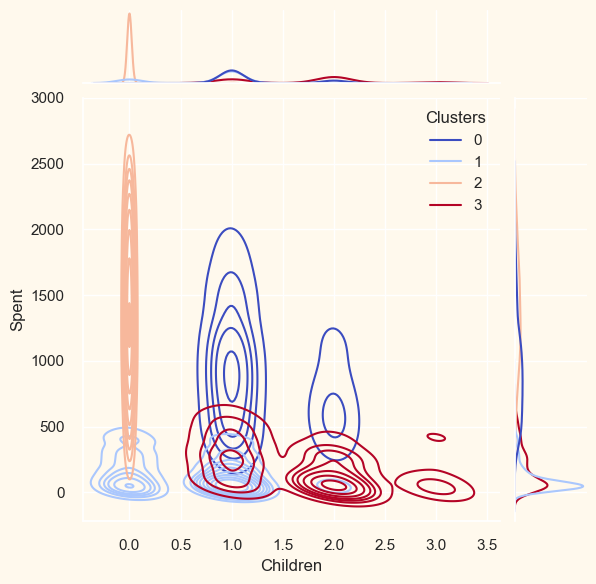

<Figure size 1000x800 with 0 Axes>

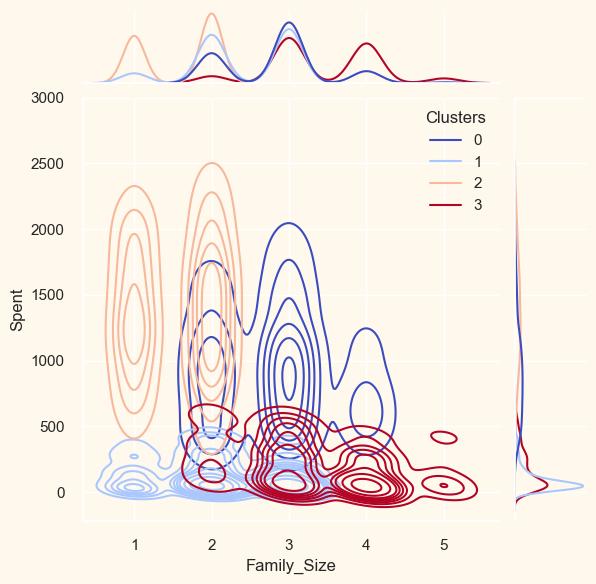

<Figure size 1000x800 with 0 Axes>

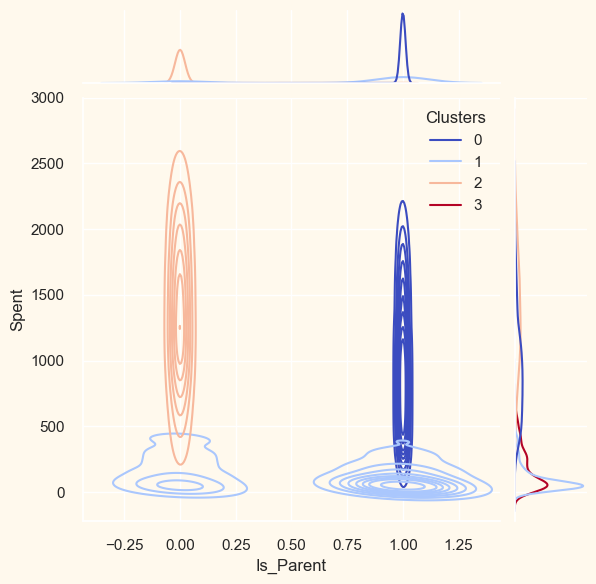

<Figure size 1000x800 with 0 Axes>

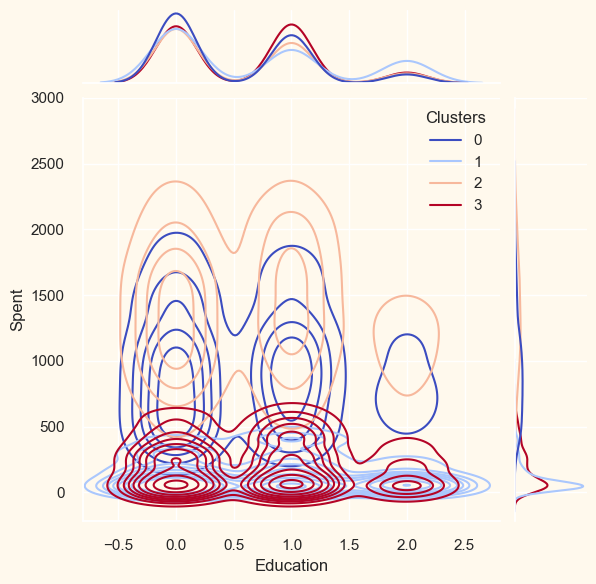

<Figure size 1000x800 with 0 Axes>

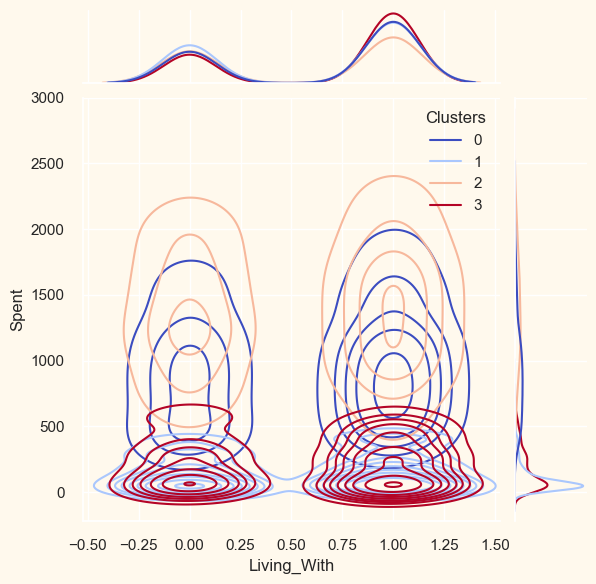

In [44]:
Personal = [ "Kidhome","Teenhome","Customer_For", "Age", "Children", "Family_Size", "Is_Parent", "Education","Living_With"]

for i in Personal:
    plt.figure(figsize=(10,8))
    sns.jointplot(x=df[i], y=df["Spent"], hue =df["Clusters"], kind="kde", palette="coolwarm")
    plt.show()

## Conclusion

**Cluster Number 0**

1.Are definitely a parent

2.At the max, have four members in the family and at least 2

3.Single parents are a subset of this group

4.Most have a teenager at home

5.Relatively older

**Cluster Number 1**

1.They are definitely a parent

2.At the max are five members in the family and at least 2

3.The majority of them have a teenager at home

4.Relatively older

5.1A lower-income group

**Cluster Number 2**

1.Are a definitely not a parent

2.At the max are only two members in the family

3.A slight majority of couples over single people

4.Span all ages

5.A high-income groups

**Cluster Number 3**

1.The majority of these people are parents

2.At the max are three members in the family

3.They majorly have one kind(and not teenagers, typically)

4.Relatively younger

In [45]:
df.head(10)

,Education,Income,Kidhome,Teenhome,Recency,Wines,Fruits,Meat,Fish,Sweets,...,Response,Customer_For,Age,Spent,Living_With,Children,Family_Size,Is_Parent,Clusters,Total_Promos
0,0,58138.0,0,0,58,635,88,546,172,88,...,1,57283200000000000,66,1617,0,0,1,0,2,0
1,0,46344.0,1,1,38,11,1,6,2,1,...,0,9763200000000000,69,27,0,2,3,1,3,0
2,0,71613.0,0,0,26,426,49,127,111,21,...,0,26956800000000000,58,776,1,0,2,0,2,0
3,0,26646.0,1,0,26,11,4,20,10,3,...,0,12009600000000000,39,53,1,1,3,1,1,0
4,1,58293.0,1,0,94,173,43,118,46,27,...,0,13910400000000000,42,422,1,1,3,1,3,0
5,1,62513.0,0,1,16,520,42,98,0,42,...,0,25315200000000000,56,716,1,1,3,1,0,0
6,0,55635.0,0,1,34,235,65,164,50,49,...,0,51235200000000000,52,590,0,1,2,1,0,0
7,1,33454.0,1,0,32,76,10,56,3,1,...,0,36028800000000000,38,169,1,1,3,1,1,0
8,1,30351.0,1,0,19,14,0,24,3,3,...,1,33523200000000000,49,46,1,1,3,1,1,0
9,1,5648.0,1,1,68,28,0,6,1,1,...,0,9331200000000000,73,49,1,2,4,1,3,1


In [46]:
df['cluster'] = kmeans.labels_

In [49]:
import joblib
joblib.dump(KMeans,"KMeans_Model.pkl")

['KMeans_Model.pkl']

In [50]:
df.to_csv("new_df.csv")

****

**Training & Testing the model accuracy using decison trees**

In [59]:
from sklearn.model_selection import train_test_split

In [54]:
nd=pd.read_csv("new_df.csv")

In [65]:
nd.drop("Unnamed: 0",axis=1,inplace=True)

In [67]:
# Split the data
X=nd.drop(["Clusters"],axis=1)

In [68]:
y=nd[["Clusters"]]

In [69]:
X_train,X_test,y_train,y_test= train_test_split(X,y,test_size=0.3)

In [70]:
X_train

,Education,Income,Kidhome,Teenhome,Recency,Wines,Fruits,Meat,Fish,Sweets,...,Response,Customer_For,Age,Spent,Living_With,Children,Family_Size,Is_Parent,Total_Promos,cluster
1506,1,82032.0,0,0,54,332,194,377,149,125,...,0,7344000000000000,75,1234,0,0,1,0,0,1
1960,0,24570.0,1,0,97,28,34,62,11,14,...,0,42076800000000000,39,193,1,1,3,1,0,0
1828,1,57705.0,0,1,14,383,0,53,6,4,...,0,14601600000000000,57,486,1,1,3,1,0,0
1459,1,57072.0,0,1,79,944,0,60,0,0,...,0,13478400000000000,62,1034,1,1,3,1,1,2
1473,0,57867.0,1,0,48,344,35,178,15,23,...,0,23414400000000000,45,612,1,1,3,1,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1732,2,31859.0,1,0,3,3,4,7,15,8,...,0,10540800000000000,43,48,0,1,2,1,0,0
1936,0,29478.0,1,0,59,8,0,7,3,1,...,0,14083200000000000,47,20,1,1,3,1,0,0
1515,2,23331.0,1,0,97,104,20,101,24,15,...,0,54604800000000000,35,269,0,1,2,1,0,0
1450,2,23162.0,1,1,82,8,3,9,19,4,...,0,16416000000000000,53,65,1,2,4,1,0,0


In [75]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report

In [73]:
# Decision Tree

model=DecisionTreeClassifier(criterion="entropy")
model.fit(X_train,y_train)
y_pred=model.predict(X_test)

In [76]:
# Confusion Matrix
print(metrics.confusion_matrix(y_test,y_pred))
print(classification_report(y_test,y_pred))

[[167   1   4   0]
 [  1 166   2  12]
 [  0   2 151   0]
 [  0   6   0 152]]
              precision    recall  f1-score   support

           0       0.99      0.97      0.98       172
           1       0.95      0.92      0.93       181
           2       0.96      0.99      0.97       153
           3       0.93      0.96      0.94       158

    accuracy                           0.96       664
   macro avg       0.96      0.96      0.96       664
weighted avg       0.96      0.96      0.96       664



In [79]:
## Saving the model for decision tree
import pickle

filename="Dec_tree.sav"
pickle.dump(model,open(filename,"wb"))

In [81]:
loaded_model=pickle.load(open(filename,"rb"))
result=loaded_model.score(X_test,y_test)
print(result,"% Accuracy")

0.9578313253012049 % Accuracy
